In [48]:
# Conflict between seaborn and numpy versions for pairplot
#!pip install seaborn==0.11.2
#!conda install numpy=1.21.5

In [49]:
#!pip install pandas==1.5.3

In [50]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [51]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, log_loss
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import tree
from sklearn.preprocessing import StandardScaler


%matplotlib inline
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#!pip install pydot
import pydot
from IPython.display import Image
from io import StringIO
from sklearn.tree import export_graphviz

In [52]:
df = pd.read_csv('diabetes_prediction_dataset.csv')

In [53]:
df.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


## EDA

In [54]:
df.shape

(100000, 9)

In [55]:
df.dtypes

gender                  object
age                    float64
hypertension             int64
heart_disease            int64
smoking_history         object
bmi                    float64
HbA1c_level            float64
blood_glucose_level      int64
diabetes                 int64
dtype: object

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


In [57]:
df.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,41.885856,0.07485,0.039420,27.320767,5.527507,138.058060,0.085000
std,22.516840,0.26315,0.194593,6.636783,1.070672,40.708136,0.278883
min,0.080000,0.00000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.00000,0.000000,23.630000,4.800000,100.000000,0.000000
50%,43.000000,0.00000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,60.000000,0.00000,0.000000,29.580000,6.200000,159.000000,0.000000
max,80.000000,1.00000,1.000000,95.690000,9.000000,300.000000,1.000000


In [58]:
df.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [59]:
df.isna().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

In [60]:
df.diabetes.value_counts()

0    91500
1     8500
Name: diabetes, dtype: int64

In [61]:
df.gender.value_counts()

Female    58552
Male      41430
Other        18
Name: gender, dtype: int64

In [62]:
df.heart_disease.value_counts()

0    96058
1     3942
Name: heart_disease, dtype: int64

In [63]:
duplicated_sum = df.duplicated().sum()
print(f"No of Duplicate rows: {duplicated_sum} ")

#Clean duplicated rows
df=df.drop_duplicates()
df.shape

No of Duplicate rows: 3854 


(96146, 9)

In [64]:
# df.plot.hist(column = 'age', by = 'gender', figsize = (10,12), grid = True)

In [65]:
# fig = px.histogram(df.smoking_history, title = "Smoking History Histogram",x = 'smoking_history', color = 'smoking_history')
# fig.show()

In [66]:
# fig = px.histogram(df.diabetes, title = "Diabetes Histogram",x = 'diabetes', color = 'diabetes')
# fig.show()

In [67]:
# # Create subplots for each variable
# fig = make_subplots(rows=2, cols=2)

# # Plot the density plot of age
# fig.add_trace(go.Histogram(x=df['age'], nbinsx=20, name='All Patients'), row=1, col=1)
# fig.add_trace(go.Histogram(x=df['age'][df['diabetes']==1], nbinsx=20, name='Diabetes Patients'), row=1, col=1)
# fig.update_xaxes(title_text='Age', row=1, col=1)
# fig.update_yaxes(title_text='Count', row=1, col=1)

# # Plot the density plot of BMI
# fig.add_trace(go.Histogram(x=df['bmi'], nbinsx=20, name='All Patients'), row=1, col=2)
# fig.add_trace(go.Histogram(x=df['bmi'][df['diabetes']==1], nbinsx=20, name='Diabetes Patients'), row=1, col=2)
# fig.update_xaxes(title_text='BMI', row=1, col=2)
# fig.update_yaxes(title_text='Count', row=1, col=2)

# # Plot the density plot of blood glucose level
# fig.add_trace(go.Histogram(x=df['blood_glucose_level'], nbinsx=20, name='All Patients'), row=2, col=1)
# fig.add_trace(go.Histogram(x=df['blood_glucose_level'][df['diabetes']==1], nbinsx=20, name='Diabetes Patients'), row=2, col=1)
# fig.update_xaxes(title_text='Blood Glucose Level', row=2, col=1)
# fig.update_yaxes(title_text='Count', row=2, col=1)

# # Plot the density plot of HbA1c level
# fig.add_trace(go.Histogram(x=df['HbA1c_level'], nbinsx=20, name='All Patients'), row=2, col=2)
# fig.add_trace(go.Histogram(x=df['HbA1c_level'][df['diabetes']==1], nbinsx=20, name='Diabetes Patients'), row=2, col=2)
# fig.update_xaxes(title_text='HbA1c Level', row=2, col=2)
# fig.update_yaxes(title_text='Count', row=2, col=2)

# fig.update_layout(title='Density Plots of Health Metrics', height=800)
# fig.show()

In [68]:
# import plotly.express as px

# fig = px.violin(df, y='age', x='gender', color='diabetes',
#                 hover_data=['bmi'],
#                 category_orders={'gender':['Male','Female'],'diabetes':['Yes','No']})
# fig.update_layout(title='Age Distribution by Gender and Diabetes Status')
# fig.show()

# fig = px.violin(df, y='age', x='hypertension', color='diabetes',
#                 hover_data=['bmi'],
#                 category_orders={'hypertension':[0,1],'diabetes':['Yes','No']})
# fig.update_layout(title='Age Distribution by hypertension and Diabetes Status')
# fig.show()


# fig = px.violin(df, y='bmi', x='gender', color='diabetes',
#                 hover_data=['bmi'],
#                 category_orders={'diabetes':['Yes','No'],'gender':['Male','Female']})
# fig.update_layout(title='BMI Distribution by Gender and Diabetes Status')
# fig.show()

# fig = px.violin(df, y='age', x='smoking_history', color='diabetes',
#                 hover_data=['bmi'],
#                 category_orders={'diabetes':['Yes','No']})
# fig.update_layout(title='Smoking History Distribution and Diabetes Status')
# fig.show()

In [69]:
num_df = df.select_dtypes(include = np.number)
num_df.head()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
0,80.0,0,1,25.19,6.6,140,0
1,54.0,0,0,27.32,6.6,80,0
2,28.0,0,0,27.32,5.7,158,0
3,36.0,0,0,23.45,5.0,155,0
4,76.0,1,1,20.14,4.8,155,0


<Axes: >

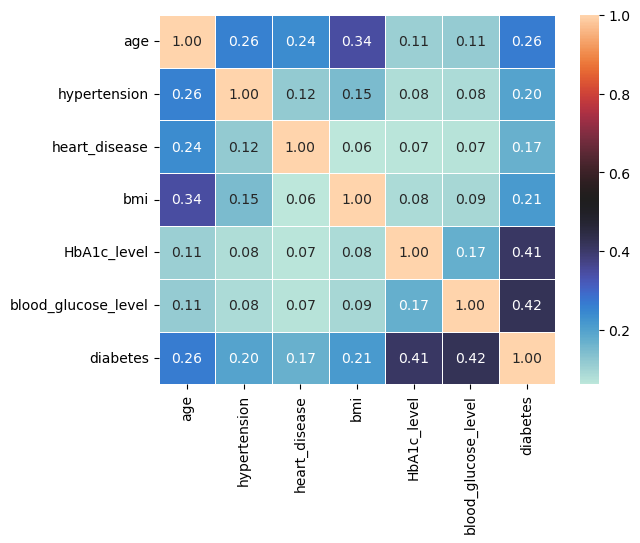

In [70]:
sns.heatmap(num_df.corr(), cmap="icefire", annot=True, fmt=".2f", linewidth=.5)

In [71]:
num_df['diabetes'] = num_df['diabetes'].astype('category')
num_df['hypertension'] = num_df['hypertension'].astype('category')
num_df['heart_disease'] = num_df['heart_disease'].astype('category')

In [72]:
fig = px.scatter_matrix(num_df,
    dimensions=["age","bmi","HbA1c_level","blood_glucose_level", "hypertension", "heart_disease", 'diabetes'],
    color="diabetes",
    title = 'Scatter Matrix',
    width = 1900,
    height = 1200,
    opacity = 0.2)
fig.show()

# Decision Tree Classifier as a benchmark

In [73]:
diabetes_dt = DecisionTreeClassifier(random_state=1234)

In [74]:
X = df.drop('diabetes', axis=1)
y = df.diabetes

X = pd.get_dummies(X)
X.head()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,gender_Female,gender_Male,gender_Other,smoking_history_No Info,smoking_history_current,smoking_history_ever,smoking_history_former,smoking_history_never,smoking_history_not current
0,80.0,0,1,25.19,6.6,140,1,0,0,0,0,0,0,1,0
1,54.0,0,0,27.32,6.6,80,1,0,0,1,0,0,0,0,0
2,28.0,0,0,27.32,5.7,158,0,1,0,0,0,0,0,1,0
3,36.0,0,0,23.45,5.0,155,1,0,0,0,1,0,0,0,0
4,76.0,1,1,20.14,4.8,155,0,1,0,0,1,0,0,0,0


In [75]:
X.dtypes

age                            float64
hypertension                     int64
heart_disease                    int64
bmi                            float64
HbA1c_level                    float64
blood_glucose_level              int64
gender_Female                    uint8
gender_Male                      uint8
gender_Other                     uint8
smoking_history_No Info          uint8
smoking_history_current          uint8
smoking_history_ever             uint8
smoking_history_former           uint8
smoking_history_never            uint8
smoking_history_not current      uint8
dtype: object

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        train_size=0.80, 
                                        test_size=0.20,
                                        shuffle=True,
                                        random_state=12345,            
                                        stratify=df.diabetes)

In [77]:
diabetes_dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1234)

In [78]:
print(diabetes_dt.classes_)

[0 1]


<Axes: title={'center': 'Feature importances'}>

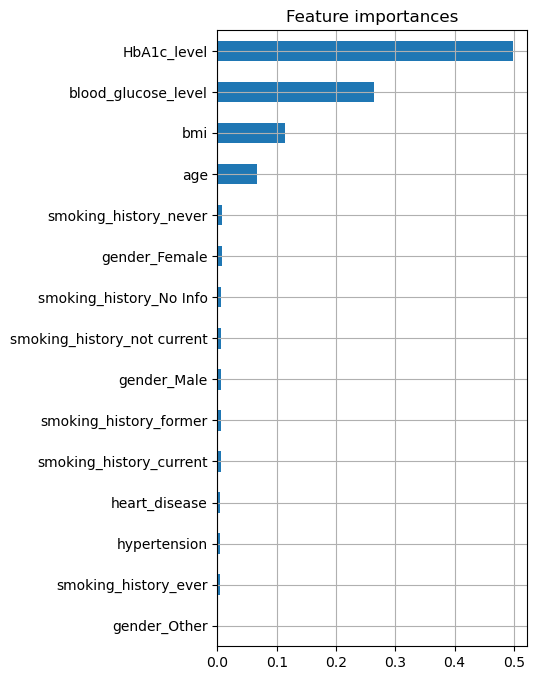

In [79]:
pd.Series(diabetes_dt.feature_importances_,
          index=X_train.columns).sort_values().plot.barh(figsize = (4,8), rot = 0, title="Feature importances", grid = True)

In [80]:
pd.Series(diabetes_dt.feature_importances_,
          index=X_train.columns).sort_values(ascending = False)

HbA1c_level                    0.497951
blood_glucose_level            0.264785
bmi                            0.114662
age                            0.066130
smoking_history_never          0.007776
gender_Female                  0.006985
smoking_history_No Info        0.006601
smoking_history_not current    0.006095
gender_Male                    0.005936
smoking_history_former         0.005630
smoking_history_current        0.005296
heart_disease                  0.004210
hypertension                   0.004123
smoking_history_ever           0.003819
gender_Other                   0.000000
dtype: float64

In [81]:
y_test_pred = diabetes_dt.predict(X_test)
y_test_pred

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

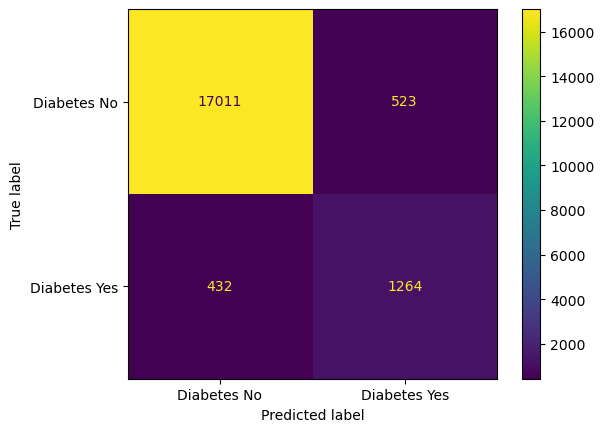

In [82]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)

cmd = ConfusionMatrixDisplay(cm, display_labels = ['Diabetes No','Diabetes Yes' ])
cmd.plot()

In [83]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     17534
           1       0.71      0.75      0.73      1696

    accuracy                           0.95     19230
   macro avg       0.84      0.86      0.85     19230
weighted avg       0.95      0.95      0.95     19230



In [84]:
DF = classification_report(y_true=y_test,
                            y_pred=y_test_pred,output_dict=True)
print(pd.DataFrame(DF).T)

              precision    recall  f1-score       support
0              0.975234  0.970172  0.972696  17534.000000
1              0.707331  0.745283  0.725811   1696.000000
accuracy       0.950338  0.950338  0.950338      0.950338
macro avg      0.841282  0.857728  0.849254  19230.000000
weighted avg   0.951606  0.950338  0.950922  19230.000000


In [85]:
# dot_data = StringIO()  
# export_graphviz(diabetes_dt, out_file=dot_data, feature_names=X.columns, 
#                 leaves_parallel=True, filled=True, class_names=np.array(sorted(y.unique())).astype('str').tolist())  
# graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]  
# Image(graph.create_png(), width=1000) 

In [86]:
from sklearn.metrics import accuracy_score
y_train_pred = diabetes_dt.predict(X_train)
y_test_pred = diabetes_dt.predict(X_test)
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)
print("Train accuracy is ", accuracy_train)
print("Test accuracy is ", accuracy_test)

Train accuracy is  0.9991549222528473
Test accuracy is  0.9503380135205408


In [87]:
pd.Series(diabetes_dt.feature_importances_,
          index=X_train.columns).sort_values(ascending = False)

HbA1c_level                    0.497951
blood_glucose_level            0.264785
bmi                            0.114662
age                            0.066130
smoking_history_never          0.007776
gender_Female                  0.006985
smoking_history_No Info        0.006601
smoking_history_not current    0.006095
gender_Male                    0.005936
smoking_history_former         0.005630
smoking_history_current        0.005296
heart_disease                  0.004210
hypertension                   0.004123
smoking_history_ever           0.003819
gender_Other                   0.000000
dtype: float64

In [88]:
y_train_pred = pd.DataFrame(diabetes_dt.predict_proba(X_train), 
                            columns=diabetes_dt.classes_)
log_loss(y_train, y_train_pred)

0.0011715265155859632

In [89]:
y_test_pred = pd.DataFrame(diabetes_dt.predict_proba(X_test), 
                        columns=diabetes_dt.classes_)
log_loss(y_test, y_test_pred)

1.7904319684229644

## Cross Validation for Decision Tree

In [90]:
from sklearn.model_selection import cross_val_score, KFold
scores = cross_val_score(diabetes_dt, X_train, y_train, cv=5, scoring = 'recall')
print(scores)

kfold = KFold(n_splits = 5)
print("Cross validation scores[recall]:\n{}".format(cross_val_score(diabetes_dt, X_train, y_train, cv=kfold,scoring = 'recall')))

[0.74300442 0.73323508 0.72955048 0.73544584 0.74207811]
Cross validation scores[recall]:
[0.74372624 0.73730044 0.73790614 0.74909355 0.7351392 ]


## Grid Search on Decision Tree on imbalanced data

In [ ]:
from sklearn.model_selection import GridSearchCV
params =  {
    'min_samples_leaf': [1, 2, 3,4,5,6,7,8],
    'max_depth': [1, 2, 3,4,5,6,7,8,9],
    'criterion':['gini', 'entropy', 'log_loss'],
}

grid = GridSearchCV(estimator=diabetes_dt,
                    param_grid=params,
                    scoring = 'recall',
                    cv=10,
                    n_jobs=1,
                    verbose=1)
#
# Fit the model
#
grid.fit(X_train, y_train)
#
# Assess the score
#
grid.best_score_, grid.best_params_


Fitting 10 folds for each of 216 candidates, totalling 2160 fits


## Imbalance Data Treatment

In [ ]:
list(y_train.unique())

In [ ]:
y_train.value_counts()
plt.pie(y_train.value_counts(), labels=['Diabetes No', 'Diabetes  Yes'], autopct='%1.1f%%')
plt.title('Imbalanced train set')
plt.show()

### Oversampling

In [ ]:
#!pip install imblearn
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=888)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

plt.pie(y_train_resampled.value_counts(), labels=['Diabetes No', 'Diabetes  Yes'], autopct='%1.1f%%')
plt.title('Oversampled train set')
plt.show()

In [ ]:
diabetes_os = DecisionTreeClassifier(random_state=4321)

In [ ]:
diabetes_os.fit(X_train_resampled, y_train_resampled)

In [ ]:
pd.Series(diabetes_os.feature_importances_,
          index=X_train_resampled.columns).sort_values().plot.barh(figsize = (4,8), rot = 0, title="Feature importances after Oversample", grid = True)

In [ ]:
pd.Series(diabetes_os.feature_importances_,
          index=X_train.columns).sort_values(ascending = False)

In [ ]:
y_test_pred_resampled = diabetes_os.predict(X_test)
y_test_pred_resampled

In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred_resampled)

cmd = ConfusionMatrixDisplay(cm, display_labels = ['Diabetes No','Diabetes Yes' ])
cmd.plot()

In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred_resampled))

In [ ]:
scores = cross_val_score(diabetes_os, X_train_resampled, y_train_resampled, cv=5, scoring = 'recall')
print(scores)

kfold = KFold(n_splits = 5)
print("Cross validation scores[recall]:\n{}".format(cross_val_score(diabetes_os, X_train_resampled, y_train_resampled, cv=kfold,scoring = 'recall')))

In [ ]:
grid = GridSearchCV(estimator=diabetes_os,
                    param_grid=params,
                    scoring = 'recall',
                    cv=10,
                    n_jobs=1,
                    verbose=1)
#
# Fit the model
#
grid.fit(X_train_resampled,  y_train_resampled)
#
# Assess the score
#
grid.best_score_, grid.best_params_


# Ask Dror above

### Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=0)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)
y_train_resampled.value_counts()

In [ ]:
diabetes_us = DecisionTreeClassifier(random_state=4321)

In [ ]:
diabetes_us.fit(X_train_resampled, y_train_resampled)

In [ ]:
pd.Series(diabetes_us.feature_importances_,
          index=X_train_resampled.columns).sort_values().plot.barh(figsize = (4,8), rot = 0, title="Feature importances after Undersample", grid = True)

In [ ]:
y_test_pred_resampled = diabetes_us.predict(X_test)
y_test_pred_resampled

In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred_resampled)

cmd = ConfusionMatrixDisplay(cm, display_labels = ['Diabetes No','Diabetes Yes' ])
cmd.plot()

In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred_resampled))

In [ ]:
scores = cross_val_score(diabetes_us, X_train_resampled, y_train_resampled, cv=5, scoring = 'recall')
print(scores)

kfold = KFold(n_splits = 5)
print("Cross validation scores[recall]:\n{}".format(cross_val_score(diabetes_us, X_train_resampled, y_train_resampled, cv=kfold,scoring = 'recall')))

# Ask Dror above

In [ ]:
grid = GridSearchCV(estimator=diabetes_us,
                    param_grid=params,
                    scoring = 'recall',
                    cv=10,
                    n_jobs=1,
                    verbose=1)
#
# Fit the model
#
grid.fit(X_train_resampled,  y_train_resampled)
#
# Assess the score
#
grid.best_score_, grid.best_params_


In [ ]:
diabetes_balanced_cw_tuned = DecisionTreeClassifier(random_state=4321, class_weight = 'balanced', criterion='entropy', max_depth= 5, min_samples_leaf=1)

## Penalizing

In [ ]:
diabetes_balanced_cw = DecisionTreeClassifier(random_state=4321, class_weight = 'balanced')


In [ ]:
diabetes_balanced_cw.fit(X_train, y_train)

In [ ]:
pd.Series(diabetes_balanced_cw.feature_importances_,
          index=X_train.columns).sort_values().plot.barh(figsize = (4,8), rot = 0, title="Feature importances after Penalizing", grid = True)

In [ ]:
y_test_pred_balanced_cw = diabetes_balanced_cw.predict(X_test)
y_test_pred_balanced_cw

In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred_balanced_cw)

cmd = ConfusionMatrixDisplay(cm, display_labels = ['Diabetes No','Diabetes Yes' ])
cmd.plot()

In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred_balanced_cw))

In [ ]:
scores = cross_val_score(diabetes_balanced_cw, X_train, y_train, cv=5, scoring = 'recall')
print(scores)

kfold = KFold(n_splits = 5)
print("Cross validation scores[recall]:\n{}".format(cross_val_score(diabetes_balanced_cw, X_train, y_train, cv=kfold,scoring = 'recall')))

In [ ]:
grid = GridSearchCV(estimator=diabetes_balanced_cw,
                    param_grid=params,
                    scoring = 'recall',
                    cv=10,
                    n_jobs=1,
                    verbose=1)
#
# Fit the model
#
grid.fit(X_train,   y_train)
#
# Assess the score
#
grid.best_score_, grid.best_params_


In [ ]:
diabetes_balanced_cw_tuned = DecisionTreeClassifier(random_state=4321, class_weight = 'balanced', criterion='entropy', max_depth= 5, min_samples_leaf=1)

In [ ]:
diabetes_balanced_cw_tuned.fit(X_train, y_train)

In [ ]:
pd.Series(diabetes_balanced_cw_tuned.feature_importances_,
          index=X_train.columns).sort_values().plot.barh(figsize = (4,8), rot = 0, title="Feature importances after Penalizing and hyperparameters tuning", grid = True)

In [ ]:
pd.Series(diabetes_balanced_cw_tuned.feature_importances_,
          index=X_train.columns).sort_values(ascending = False)

In [ ]:
y_test_pred_balanced_cw_tuned = diabetes_balanced_cw_tuned.predict(X_test)
y_test_pred_balanced_cw_tuned

In [ ]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred_balanced_cw_tuned)

cmd = ConfusionMatrixDisplay(cm, display_labels = ['Diabetes No','Diabetes Yes' ])
cmd.plot()

In [ ]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred_balanced_cw_tuned))